<a href="https://colab.research.google.com/github/arindam09-coder/Deep-Learning-for-Synthetic-Media-Detection/blob/main/PBL2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook presents a deep learning–based prototype for detecting synthetic media. A ResNet18 convolutional neural network using transfer learning is trained on the CIFAKE dataset to classify images as real or AI-generated.

In [ ]:
import torch
print("GPU Available:", torch.cuda.is_available())


GPU Available: True


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving archive.zip to archive.zip


In [ ]:
!unzip archive.zip


Streaming output truncated to the last 5000 lines.
  inflating: train/REAL/4500 (10).jpg  
  inflating: train/REAL/4500 (2).jpg  
  inflating: train/REAL/4500 (3).jpg  
  inflating: train/REAL/4500 (4).jpg  
  inflating: train/REAL/4500 (5).jpg  
  inflating: train/REAL/4500 (6).jpg  
  inflating: train/REAL/4500 (7).jpg  
  inflating: train/REAL/4500 (8).jpg  
  inflating: train/REAL/4500 (9).jpg  
  inflating: train/REAL/4500.jpg     
  inflating: train/REAL/4501 (10).jpg  
  inflating: train/REAL/4501 (2).jpg  
  inflating: train/REAL/4501 (3).jpg  
  inflating: train/REAL/4501 (4).jpg  
  inflating: train/REAL/4501 (5).jpg  
  inflating: train/REAL/4501 (6).jpg  
  inflating: train/REAL/4501 (7).jpg  
  inflating: train/REAL/4501 (8).jpg  
  inflating: train/REAL/4501 (9).jpg  
  inflating: train/REAL/4501.jpg     
  inflating: train/REAL/4502 (10).jpg  
  inflating: train/REAL/4502 (2).jpg  
  inflating: train/REAL/4502 (3).jpg  
  inflating: train/REAL/4502 (4).jpg  
  inflating:

In [ ]:
import torch
print(torch.cuda.get_device_name(0))


Tesla T4


In [ ]:
import os

print(os.listdir("."))


['.config', 'train', 'archive.zip', 'test', 'sample_data']


In [ ]:
print("Train folders:", os.listdir("train"))
print("Test folders:", os.listdir("test"))


Train folders: ['FAKE', 'REAL']
Test folders: ['FAKE', 'REAL']


In [ ]:
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])

train_data = datasets.ImageFolder(
    "train",
    transform=transform
)

test_data = datasets.ImageFolder(
    "test",
    transform=transform
)

train_loader = DataLoader(
    train_data,
    batch_size=32,
    shuffle=True
)

test_loader = DataLoader(
    test_data,
    batch_size=32
)

print("Classes:", train_data.classes)
print("Train size:", len(train_data))
print("Test size:", len(test_data))


Classes: ['FAKE', 'REAL']
Train size: 100000
Test size: 20000


In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Using device:", device)


Using device: cuda


In [ ]:
model = models.resnet18(
    weights=models.ResNet18_Weights.DEFAULT
)

# Freeze base layers
for param in model.parameters():
    param.requires_grad = False

# Replace final layer
model.fc = nn.Linear(
    model.fc.in_features,
    2
)

model = model.to(device)

print("Model ready.")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 218MB/s]


Model ready.


In [ ]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(
    model.fc.parameters(),
    lr=0.001
)


In [ ]:
epochs = 1

for epoch in range(epochs):

    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in train_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    acc = 100 * correct / total

    print(
        f"Epoch {epoch+1}/{epochs} | "
        f"Loss: {running_loss:.4f} | "
        f"Accuracy: {acc:.2f}%"
    )


Epoch 1/1 | Loss: 1058.5267 | Accuracy: 85.30%


In [ ]:
# Continue training for 1 more epoch

model.train()

running_loss = 0
correct = 0
total = 0

for images, labels in train_loader:

    images = images.to(device)
    labels = labels.to(device)

    outputs = model(images)
    loss = criterion(outputs, labels)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    running_loss += loss.item()

    _, predicted = torch.max(outputs, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

acc = 100 * correct / total

print(
    f"Epoch 2/2 | "
    f"Loss: {running_loss:.4f} | "
    f"Accuracy: {acc:.2f}%"
)


Epoch 2/2 | Loss: 990.1082 | Accuracy: 86.39%


In [ ]:
model.eval()

correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_acc = 100 * correct / total
print(f"Test Accuracy: {test_acc:.2f}%")


Test Accuracy: 88.64%


In [ ]:
torch.save(
    model.state_dict(),
    "deepfake_model_cifake.pth"
)

print("Model saved successfully.")


Model saved successfully.


In [ ]:
from google.colab import files
files.download("deepfake_model_cifake.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from PIL import Image
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])

def predict_image(img_path):

    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        _, pred = torch.max(outputs, 1)

    classes = ["FAKE", "REAL"]

    return classes[pred.item()]


In [ ]:
result = predict_image("TableF (1).png")
print("Prediction:", result)


Prediction: FAKE


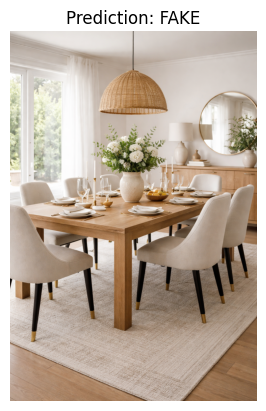

In [ ]:
import matplotlib.pyplot as plt

img = Image.open("TableF (1).png")

plt.imshow(img)
plt.axis("off")
plt.title(f"Prediction: {result}")
plt.show()


# **DEMO**

In [1]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

In [3]:
from google.colab import files

print("Upload your trained model (.pth file)")
uploaded = files.upload()

Upload your trained model (.pth file)


Saving deepfake_model_cifake.pth to deepfake_model_cifake.pth


In [4]:
model = models.resnet18(
    weights=models.ResNet18_Weights.DEFAULT
)

# Modify final layer for binary classification
model.fc = nn.Linear(
    model.fc.in_features,
    2
)


In [5]:
model_path = "deepfake_model_cifake.pth"

model.load_state_dict(
    torch.load(
        model_path,
        map_location=device
    )
)


<All keys matched successfully>

In [6]:
model = model.to(device)
model.eval()

print("Model loaded successfully and ready for prediction!")

Model loaded successfully and ready for prediction!


In [7]:
from google.colab import files
files.upload()


Saving TableR.jpg to TableR.jpg


{'TableR.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x02\x01\x00H\x00H\x00\x00\xff\xe2\x0cXICC_PROFILE\x00\x01\x01\x00\x00\x0cHLino\x02\x10\x00\x00mntrRGB XYZ \x07\xce\x00\x02\x00\t\x00\x06\x001\x00\x00acspMSFT\x00\x00\x00\x00IEC sRGB\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xd6\x00\x01\x00\x00\x00\x00\xd3-HP  \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11cprt\x00\x00\x01P\x00\x00\x003desc\x00\x00\x01\x84\x00\x00\x00lwtpt\x00\x00\x01\xf0\x00\x00\x00\x14bkpt\x00\x00\x02\x04\x00\x00\x00\x14rXYZ\x00\x00\x02\x18\x00\x00\x00\x14gXYZ\x00\x00\x02,\x00\x00\x00\x14bXYZ\x00\x00\x02@\x00\x00\x00\x14dmnd\x00\x00\x02T\x00\x00\x00pdmdd\x00\x00\x02\xc4\x00\x00\x00\x88vued\x00\x00\x03L\x00\x00\x00\x86view\x00\x00\x03\xd4\x00\x00\x00$lumi\x00\x00\x03\xf8\x00\x00\x00\x14meas\x00\x00\x04\x0c\x00\x00\x00$tech\x00\x00\x040\x00\x00\x00\x0crTRC\

In [8]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485,0.456,0.406],
        [0.229,0.224,0.225]
    )
])

def predict_image(img_path):

    img = Image.open(img_path).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img_tensor)
        _, pred = torch.max(outputs, 1)

    classes = ["FAKE", "REAL"]
    return classes[pred.item()]


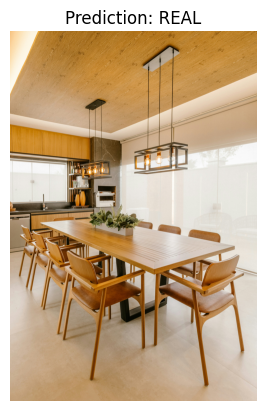

In [9]:
result = predict_image("TableR.jpg")

img = Image.open("TableR.jpg")

plt.imshow(img)
plt.axis("off")
plt.title(f"Prediction: {result}")
plt.show()
